### Activity recognition with healthy older people using a batteryless wearable sensor Data Set


#### Data Set Information:

1. This dataset contains the motion data of 14 healthy older aged between 66 and 86 years old, performed broadly scripted activities using a batteryless, wearable sensor on top of their clothing at sternum level. 

2. Data is sparse and noisy due to the use of a passive sensor.

3. Participants were allocated in two clinical room settings (S1 and S2). 

4. The setting of S1 (Room1) uses 4 RFID reader antennas around the room (one on ceiling level, and 3 on wall level) for the collection of data, whereas the room setting S2 (Room2) uses 3 RFID reader antennas (two at ceiling level and one at wall level) for the collection of motion data.

5. The activities performed were:

>walking to the chair,

>sitting on the chair,

>getting off the chair,

>walking to bed,

>lying on bed,

>getting off the bed and

>walking to the door.

6. Hence the possible class labels assigned for every sensor observation are:
- Sitting on bed
- Sitting on chair
- Lying on bed
- Ambulating, where ambulating includes standing, walking around the room.

##### objective :
> retrive the data from different file into sigle file.

>prevent data leakage (check for the duplicate and eleminate).

>check for null/zero replace them  with knn imputer/ mean value.

> we will test the baggingclassifier with DecisionTreeClassifier() and KNN() as estimator_[1]

> achive maximum accuracy with both model,try with best parameter (as system your system is slow try random hyperperameter tuning).

> check the score and make the confusion matrix and check where model is falied to predict true label.


In [224]:
import pandas as pd
import csv
import os
import pandas as pd 
import numpy as np
from sklearn.utils import shuffle
from sklearn.metrics import plot_confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.datasets import make_classification
from sklearn import tree 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
from pandas_profiling import ProfileReport
from sklearn.neighbors import KNeighborsClassifier

In [2]:
class task:
    def __init__(self, path):

        self.all_files = None
        self.label = None
        self.file_len = None
        self.folder_path = None
        self.path = path

    def walkthrough(self):
        """
        Comment:1 walk through into the location/directory and the path
        """
        try:
            self.folder_path = []
            self.file_len = []
            self.filename=[]
            
            for dirpath, dirnames, filenames in os.walk(self.path):
                #print(f"There are {len(dirnames)} directories and {len(filenames)} files in '{dirpath}'.")
                self.folder_path.append(dirpath)
                self.file_len.append(len(filenames))
                self.filename.append(filenames)
            return self.folder_path, self.file_len,self.filename

        except Exception as e:
            raise Exception("error in walkthrough", str(e))

    def allfiles(self):
        """
        Comment:2 walk through into the location/directory and checking for the files inside the directory
        """
        try:
           
            n = 0
            j=0
            self.walkthrough()[2]
            self.all_files = []
            end_range = len(self.file_len)
            start_range = 1

            for i in self.file_len[start_range:end_range]:
                j= j+1
                n= n+1
                for iter1 in range(0, i ):
                    # print(f"{folder_path[n]}/{filename[j][iter1]}")
                    self.all_files.append(f"{self.folder_path[n]}/{self.filename[j][iter1]}")#.csv in not in filepath
            return self.all_files

        except Exception as e:
            raise Exception("error in all_flies", str(e))
            
            
    def labels(self):
        """
        Comment:2 walk through into the location/directory and checking for the files inside the directory
        """
        try:
            self.walkthrough()[1]
            self.label = os.listdir(self.folder_path[0])
            # print(self.label)
            return self.label
        except Exception as e:
            raise Exception("error in folders function", str(e))

    def dataset_reading_writing(self):
        """
        # reading all file one by one
        :return:
        """
        try:
            self.walkthrough()
            self.allfiles()
            self.labels()
            self.file_cont = []
            for m in range(len(self.all_files)):
                z = 0
                with open(self.all_files[m], 'r') as file:
                    data = csv.reader(file, delimiter="\n")
                    for j in data:
                        if 0 <= z <= len(self.all_files):
                            if self.label[z] in self.all_files[m]:
                                # print(j[0].split(',') + [self.label[z]])
                                self.file_cont.append(j[0].split(','))
                            else:
                                z = z + 1
                    

                with open("d:/activityrecog.txt", "a+") as file:
                    writer = csv.writer(file)
                    writer.writerows(self.file_cont)
                

            return print("data from all file combined.... check the file")

        except Exception as e:
            raise Exception("error in dataset_write", str(e))


In [3]:
a = task('C:/Users/Manoj Negi/Downloads/Datasets_Healthy_Older_People')
a.dataset_reading_writing()

data from all file combined.... check the file


try:
    
    
except Exception as e:
    raise Exception("error in folders function", str(e))
    

In [4]:
class ml1:
    def __init__(self, path):
        self.path = path
    
    def data(self):
        try:
            data=pd.read_csv(self.path)
            return data
        except Exception as e:
            raise Exception("error call function", str(e))
            
    def pandasProfileReport(self):
        try:
            data=self.data()
            profile=ProfileReport(data,title="MOVEMENT SENSOR DATA PROFILE")
            return profile
        
        except Exception as e:
            raise Exception("error in  ProfileReport",str(e))    
            
            
    def remove_duplicate(self):
        """
        let's remove the duplicate data:
        """
        try:
            data=self.data()
            df=data.drop_duplicates()
            return df
        
        except Exception as e:
            raise Exception("error in remove_duplicate",str(e)) 
            
            
    def index_null(self):
        
        """
        index_check_for_null shows that how may index are have null.
        """
        try:
            df=self.remove_duplicate()
            print(f"null in index:{df.columns[df.isnull().any()]}")
            print(f"null values in column :{df.isnull().sum()}")
            return df
        
        except Exception as e:
            raise Exception("error in index_check_for_null",str(e))
            
    def fix_zero(self,column):
        self.column=column
        
        try:
            df=self.remove_duplicate()
            df[column]= df[column].replace(0, df[column].mean())
            df_new=df
            return df_new
        
        except Exception as e:
            raise Exception("error in data_shuffle",str(e)) 
           
    
    
    
            
    



In [5]:
data=ml1("activityrecog.txt")
data.data().head(5)

,Time in seconds,Acceleration reading in G for frontal axis,Acceleration reading in G for vertical axis,Acceleration reading in G for lateral axis,Id of antenna reading sensor,Received signal strength indicator (RSSI),Phase,Frequency,Label of activity
0,0.00,0.27203,1.00820,-0.082102,1,-63.5,2.4252,924.25,1
1,0.50,0.27203,1.00820,-0.082102,1,-63.0,4.7369,921.75,1
2,1.50,0.44791,0.91636,-0.013684,1,-63.5,3.0311,923.75,1
3,1.75,0.44791,0.91636,-0.013684,1,-63.0,2.0371,921.25,1
4,2.50,0.34238,0.96229,-0.059296,1,-63.5,5.8920,920.25,1


In [6]:
data.pandasProfileReport()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
data.remove_duplicate()

,Time in seconds,Acceleration reading in G for frontal axis,Acceleration reading in G for vertical axis,Acceleration reading in G for lateral axis,Id of antenna reading sensor,Received signal strength indicator (RSSI),Phase,Frequency,Label of activity
0,0.00,0.27203,1.00820,-0.082102,1,-63.5,2.4252,924.25,1
1,0.50,0.27203,1.00820,-0.082102,1,-63.0,4.7369,921.75,1
2,1.50,0.44791,0.91636,-0.013684,1,-63.5,3.0311,923.75,1
3,1.75,0.44791,0.91636,-0.013684,1,-63.0,2.0371,921.25,1
4,2.50,0.34238,0.96229,-0.059296,1,-63.5,5.8920,920.25,1
...,...,...,...,...,...,...,...,...,...
2744961,444.00,0.90520,0.64076,-0.082102,1,-59.5,1.9574,922.25,2
2744962,449.00,0.90520,0.64076,-0.082102,1,-59.0,6.2540,922.25,2
2744963,451.50,0.42446,0.91636,-0.161920,1,-53.0,5.7156,922.25,4
2744964,451.58,0.42446,0.91636,-0.161920,1,-52.0,5.8982,922.25,4


In [8]:
data=ml1("activityrecog.txt")
data.index_null()

null in index:Index([], dtype='object')
null values in column :Time in seconds                                0
Acceleration reading in G for frontal axis     0
Acceleration reading in G for vertical axis    0
Acceleration reading in G for lateral axis     0
Id of antenna reading sensor                   0
Received signal strength indicator (RSSI)      0
Phase                                          0
Frequency                                      0
Label of activity                              0
dtype: int64


,Time in seconds,Acceleration reading in G for frontal axis,Acceleration reading in G for vertical axis,Acceleration reading in G for lateral axis,Id of antenna reading sensor,Received signal strength indicator (RSSI),Phase,Frequency,Label of activity
0,0.00,0.27203,1.00820,-0.082102,1,-63.5,2.4252,924.25,1
1,0.50,0.27203,1.00820,-0.082102,1,-63.0,4.7369,921.75,1
2,1.50,0.44791,0.91636,-0.013684,1,-63.5,3.0311,923.75,1
3,1.75,0.44791,0.91636,-0.013684,1,-63.0,2.0371,921.25,1
4,2.50,0.34238,0.96229,-0.059296,1,-63.5,5.8920,920.25,1
...,...,...,...,...,...,...,...,...,...
2744961,444.00,0.90520,0.64076,-0.082102,1,-59.5,1.9574,922.25,2
2744962,449.00,0.90520,0.64076,-0.082102,1,-59.0,6.2540,922.25,2
2744963,451.50,0.42446,0.91636,-0.161920,1,-53.0,5.7156,922.25,4
2744964,451.58,0.42446,0.91636,-0.161920,1,-52.0,5.8982,922.25,4


In [9]:
## removing zeros to mean val()
data=ml1("activityrecog.txt")
data.fix_zero('Phase')

,Time in seconds,Acceleration reading in G for frontal axis,Acceleration reading in G for vertical axis,Acceleration reading in G for lateral axis,Id of antenna reading sensor,Received signal strength indicator (RSSI),Phase,Frequency,Label of activity
0,0.00,0.27203,1.00820,-0.082102,1,-63.5,2.4252,924.25,1
1,0.50,0.27203,1.00820,-0.082102,1,-63.0,4.7369,921.75,1
2,1.50,0.44791,0.91636,-0.013684,1,-63.5,3.0311,923.75,1
3,1.75,0.44791,0.91636,-0.013684,1,-63.0,2.0371,921.25,1
4,2.50,0.34238,0.96229,-0.059296,1,-63.5,5.8920,920.25,1
...,...,...,...,...,...,...,...,...,...
2744961,444.00,0.90520,0.64076,-0.082102,1,-59.5,1.9574,922.25,2
2744962,449.00,0.90520,0.64076,-0.082102,1,-59.0,6.2540,922.25,2
2744963,451.50,0.42446,0.91636,-0.161920,1,-53.0,5.7156,922.25,4
2744964,451.58,0.42446,0.91636,-0.161920,1,-52.0,5.8982,922.25,4


In [73]:
data=ml1("activityrecog.txt")
fixed_data=data.fix_zero('Time in seconds')

In [74]:
fixed_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75099 entries, 0 to 2744965
Data columns (total 9 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Time in seconds                              75099 non-null  float64
 1   Acceleration reading in G for frontal axis   75099 non-null  float64
 2   Acceleration reading in G for vertical axis  75099 non-null  float64
 3   Acceleration reading in G for lateral axis   75099 non-null  float64
 4   Id of antenna reading sensor                 75099 non-null  int64  
 5   Received signal strength indicator (RSSI)    75099 non-null  float64
 6   Phase                                        75099 non-null  float64
 7   Frequency                                    75099 non-null  float64
 8   Label of activity                            75099 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 5.7 MB


In [12]:
ProfileReport(fixed_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Random Data Checking:

In [13]:
(fixed_data == 0).sum()

Time in seconds                                0
Acceleration reading in G for frontal axis     0
Acceleration reading in G for vertical axis    0
Acceleration reading in G for lateral axis     0
Id of antenna reading sensor                   0
Received signal strength indicator (RSSI)      0
Phase                                          1
Frequency                                      0
Label of activity                              0
dtype: int64

In [14]:
b=data.data()

In [15]:
len(b)

2744966

In [16]:
b.duplicated().sum()

2669867

In [17]:
(b==0).sum()

Time in seconds                                3450
Acceleration reading in G for frontal axis        0
Acceleration reading in G for vertical axis       0
Acceleration reading in G for lateral axis        0
Id of antenna reading sensor                      0
Received signal strength indicator (RSSI)         0
Phase                                            45
Frequency                                         0
Label of activity                                 0
dtype: int64

In [279]:
class ml2:
    
    def __init__(self,data):
        try:
            self.data=data
            
        except Exception as e:
            raise Exception("class ml2-init function error",str(e)) 

                
    def data_shuffle(self):
        """
        shuffling the data to prevent the data leakage
        """
        try:
            new_df = shuffle(self.data,random_state=21)
            return new_df

        except Exception as e:
            raise Exception("error in data_shuffle",str(e))

        
    def feature_label(self):
        """ 
        """
        try:
            new_df=self.data_shuffle()
            x=new_df.drop(columns=["Label of activity"])
            y=new_df["Label of activity"]
            #print(x,y)
            return x, y
        
        except Exception as e:
            raise Exception("class ml2-feature-label function error",str(e))
            
            
    def train_test_split(self):
        """
        """
        try:
            new_data=self.feature_label()
            x=new_data[0]
            y=new_data[1]
            x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.10,random_state=21)
            return x_train,x_test,y_train,y_test
            
        except Exception as e:
            raise Exception("class ml2-feature-error in train_test_split",str(e))
            
    def bagging_model_prediction(self, model):
        """
        model_1 to test: BaggingClassifier(DecisionTreeClassifier(),n_estimators=10,random_state=21,verbose=0)
        model_2 to test:  (KNeighborsClassifier(),n_estimators=10,random_state=21,verbose=0)
        """
        
        try:
            x_train,x_test,y_train,y_test=self.train_test_split()
            bag_model=model
            bag_model.fit(x_train,y_train)
            prediction=bag_model.predict(x_test)   # prediction x_test
            score=bag_model.score(x_test,y_test)  # score x_test,y_test
            return prediction,score
            
        except Exception as e:
            raise Exception("class ml2-feature-error in bagging_decision",str(e))
            
            

    

In [180]:
## calling shuffle function:
class_ml2=ml2(fixed_data)
class_ml2.data_shuffle()


,Time in seconds,Acceleration reading in G for frontal axis,Acceleration reading in G for vertical axis,Acceleration reading in G for lateral axis,Id of antenna reading sensor,Received signal strength indicator (RSSI),Phase,Frequency,Label of activity
2011771,763.50,0.28376,0.250330,-1.051400,2,-47.5,0.18101,920.25,3
317613,334.30,1.09280,0.020670,-0.139120,1,-56.0,5.88590,923.25,3
866955,327.50,0.96383,0.204400,-0.173330,4,-62.5,2.49890,923.75,3
1942562,540.50,0.29548,0.284780,-0.994340,2,-51.0,2.01260,921.25,3
613580,234.00,1.33900,-0.071196,-0.025087,1,-56.5,1.66280,922.25,3
...,...,...,...,...,...,...,...,...,...
522354,433.03,1.08110,0.043636,-0.116310,3,-55.0,1.72110,922.75,3
1808488,1016.00,0.38928,0.319230,-0.982940,2,-49.5,5.88740,920.75,3
191037,287.07,0.30721,0.973770,0.100350,4,-57.5,0.54610,920.25,1
2224902,619.33,1.15140,-0.105650,-0.036490,3,-60.0,5.64040,922.25,3


In [181]:
## splicting the data into featue and label: print feature
class_ml2=ml2(fixed_data)
print(class_ml2.feature_label()[0])

         Time in seconds  Acceleration reading in G for frontal axis  \
2011771           763.50                                     0.28376   
317613            334.30                                     1.09280   
866955            327.50                                     0.96383   
1942562           540.50                                     0.29548   
613580            234.00                                     1.33900   
...                  ...                                         ...   
522354            433.03                                     1.08110   
1808488          1016.00                                     0.38928   
191037            287.07                                     0.30721   
2224902           619.33                                     1.15140   
2224285            65.25                                     1.30390   

         Acceleration reading in G for vertical axis  \
2011771                                     0.250330   
317613                 

In [182]:
## splicting the data into featue and label: print label
class_ml2=ml2(fixed_data)
print(class_ml2.feature_label()[1])

2011771    3
317613     3
866955     3
1942562    3
613580     3
          ..
522354     3
1808488    3
191037     1
2224902    3
2224285    3
Name: Label of activity, Length: 75099, dtype: int64


In [183]:
# check ing the length: x_train and y_train
class_ml2=ml2(fixed_data)
print(f"length of x_train:{len(class_ml2.train_test_split()[0])}") # x_train
print(f"shape of x_train:{(class_ml2.train_test_split()[0]).shape}") # x_train
print("\n")

print(f"length of x_test:{len(class_ml2.train_test_split()[1])}") # x_test
print(f"shape of x_test:{(class_ml2.train_test_split()[1]).shape}") # x_test
print("\n")

print(f"length of y_train:{len(class_ml2.train_test_split()[2])}") # y_train
print(f"shape of y_train:{(class_ml2.train_test_split()[2]).shape}") # y_train
print("\n")

print(f"length of y_test:{len(class_ml2.train_test_split()[3])}") # y_test
print(f"shape of y_test:{(class_ml2.train_test_split()[3]).shape}") # y_test
print("\n")

length of x_train:67589
shape of x_train:(67589, 8)


length of x_test:7510
shape of x_test:(7510, 8)


length of y_train:67589
shape of y_train:(67589,)


length of y_test:7510
shape of y_test:(7510,)




### BAGGING:

##### 1. Bagging, also known as bootstrap aggregation, is the ensemble learning method that is commonly used to reduce variance within a noisy dataset. 

##### 2. In bagging, a random sample of data in a training set is selected with replacement—meaning that the individual data points can be chosen more than once.



###  Bagging classifier.

A Bagging classifier is an ensemble meta-estimator that fits base classifiers each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction. Such a meta-estimator can typically be used as a way to reduce the variance of a black-box estimator (e.g., a decision tree), by introducing randomization into its construction procedure and then making an ensemble out of it.

This algorithm encompasses several works from the literature.
1. When random subsets of the dataset are drawn as random subsets of the samples, then this algorithm is known as Pasting.

2. If samples are drawn with replacement, then the method is known as Bagging

3. When random subsets of the dataset are drawn as random subsets of the features, then the method is known as Random Subspaces.

4. Finally, when base estimators are built on subsets of both samples and features, then the method is known as Random Patches 

In [316]:
# transform and fitting: 
#model_1 to test: BaggingClassifier(DecisionTreeClassifier(),n_estimators=10,random_state=21,verbose=0)

model_1=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10,random_state=21,verbose=0)

class_ml2=ml2(fixed_data)
result=class_ml2.bagging_model_prediction(model_1)
        

In [317]:
## baggingclassifer, with decisiontreeclassifer: Results
print(f"predictions on decisiontreeclassifer:{result[0]}")
print("\n")
print(f"Acc_Score:{result[1]}")
print(f"Model score on test set: {(result[1]*100):.2f}%")

predictions on decisiontreeclassifer:[1 1 3 ... 3 1 3]


Acc_Score:0.9898801597869508
Model score on test set: 98.99%


In [318]:
pred=result[0]
pred

array([1, 1, 3, ..., 3, 1, 3], dtype=int64)

In [307]:
labels=["_","Sitting on bed","Sitting on chair","Lying on bed","Ambulating"]

In [308]:
labels[0]

'_'

In [319]:
import sklearn
from sklearn.datasets import make_classification
report=sklearn.metrics.classification_report(y_test, pd.DataFrame(pred))
print(report)

              precision    recall  f1-score   support

           1       0.97      0.99      0.98      1644
           2       0.97      0.98      0.97       459
           3       1.00      1.00      1.00      5162
           4       0.96      0.82      0.89       245

    accuracy                           0.99      7510
   macro avg       0.97      0.95      0.96      7510
weighted avg       0.99      0.99      0.99      7510



In [324]:
pred_label_list=[]
for i in pred:
    pred_label_list.append(labels[i])
    
#print(pred_label_list)

In [325]:
class_ml2=ml2(fixed_data)
y_label=class_ml2.train_test_split()[3]

true_label_list=[]
for i in y_label:
    true_label_list.append(labels[i])
    
#print(true_label_list)

In [326]:
## how correct our prediction are:
pred_df = pd.DataFrame({
                        "y_true":y_label,
                        "y_pred":pred,
                        "tre_predicted_label":true_label_list,
                        "predicted_label":pred_label_list
                         })
                        
# 3. Is the prediction correct?
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df[:]

,y_true,y_pred,tre_predicted_label,predicted_label,pred_correct
439711,1,1,Sitting on bed,Sitting on bed,True
475939,1,1,Sitting on bed,Sitting on bed,True
565638,3,3,Lying on bed,Lying on bed,True
479415,1,1,Sitting on bed,Sitting on bed,True
373023,1,1,Sitting on bed,Sitting on bed,True
...,...,...,...,...,...
566496,3,3,Lying on bed,Lying on bed,True
522353,3,3,Lying on bed,Lying on bed,True
664531,3,3,Lying on bed,Lying on bed,True
5097,1,1,Sitting on bed,Sitting on bed,True


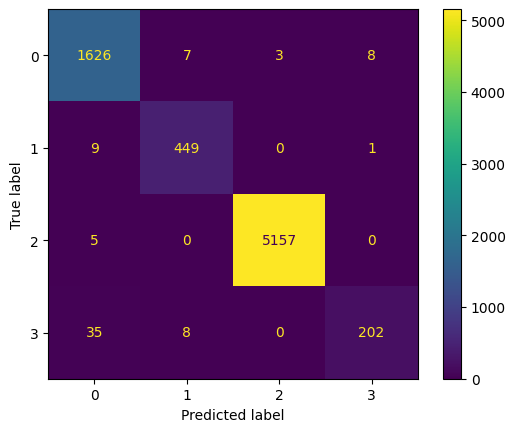

In [323]:
## creating confusion matrix:
from sklearn.metrics import ConfusionMatrixDisplay
cm=confusion_matrix(y_label, pred)
cm_display = ConfusionMatrixDisplay(cm).plot()

D:\env\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


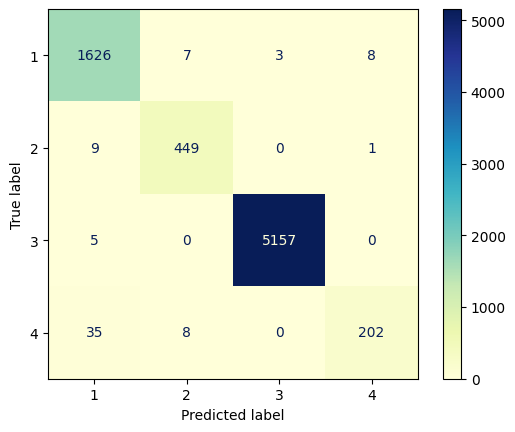

In [327]:
## detail report:
class_ml2=ml2(fixed_data)
x_train=class_ml2.train_test_split()[0]
x_test=class_ml2.train_test_split()[1]
y_train=class_ml2.train_test_split()[2]
y_test=class_ml2.train_test_split()[3]


bag_clf=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10,random_state=21,verbose=0)
bag_clf.fit(x_train,y_train)
plot_confusion_matrix(bag_clf ,x_test, pd.DataFrame(y_test),cmap='YlGnBu');


An F1-score means a statistical measure of the accuracy of a test or an individual. 

>It is composed of two primary attributes, viz. precision and recall, both calculated as percentages and combined as harmonic mean to assign a single number, easy for comprehension.

>The F1 score can be interpreted as a harmonic mean of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0. The relative contribution of precision and recall to the F1 score are equal. The formula for the F1 score is:
>> [F1 = 2 * (precision * recall) / (precision + recall)]

>In the multi-class and multi-label case, this is the average of the F1 score of each class with weighting depending on the average parameter.



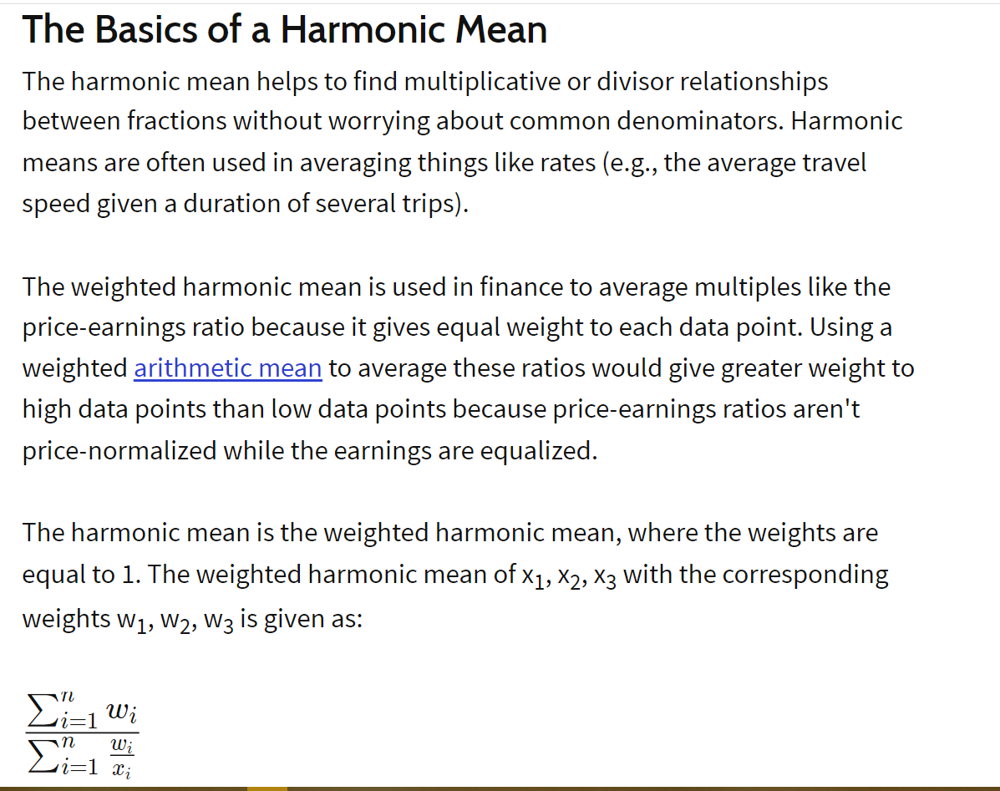

DecisionTreeClassifier(random_state=1884566740)


[Text(0.4328861005380817, 0.9827586206896551, 'X[2] <= 0.543\ngini = 0.477\nsamples = 42696\nvalue = [14611, 4583, 46362, 2033]'),
 Text(0.07854719295775862, 0.9482758620689655, 'X[2] <= 0.44\ngini = 0.015\nsamples = 29555\nvalue = [342, 5, 46329, 17]'),
 Text(0.04953012460101531, 0.9137931034482759, 'X[2] <= 0.359\ngini = 0.007\nsamples = 28784\nvalue = [148, 0, 45317, 15]'),
 Text(0.03236121366043135, 0.8793103448275862, 'X[0] <= 1735.65\ngini = 0.001\nsamples = 27363\nvalue = [20, 0, 43174, 3]'),
 Text(0.030890249403139013, 0.8448275862068966, 'X[6] <= 6.273\ngini = 0.001\nsamples = 27362\nvalue = [20, 0, 43174, 1]'),
 Text(0.019122535344800344, 0.8103448275862069, 'X[3] <= -1.114\ngini = 0.001\nsamples = 27279\nvalue = [16, 0, 43052, 1]'),
 Text(0.0073548212864616705, 0.7758620689655172, 'X[3] <= -1.125\ngini = 0.077\nsamples = 20\nvalue = [1, 0, 24, 0]'),
 Text(0.005883857029169336, 0.7413793103448276, 'gini = 0.0\nsamples = 17\nvalue = [0, 0, 21, 0]'),
 Text(0.008825785543754005,

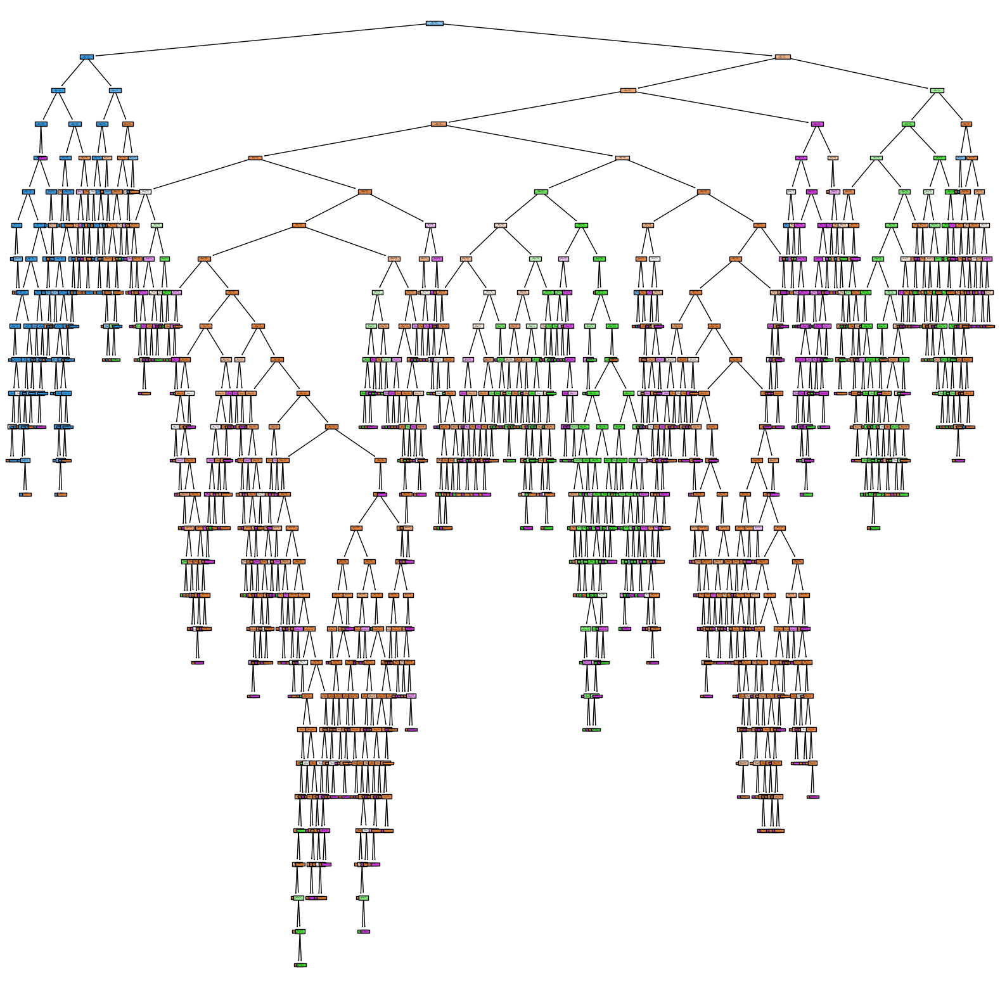

In [328]:
import matplotlib.pyplot as plt
print(bag_clf.estimators_[1])
plt.figure(figsize=(20,20))
tree.plot_tree(bag_clf.estimators_[1],filled=True)


## baggingclassifer with kneighbour: 

In [329]:
#model_2 to test:  (KNeighborsClassifier(),n_estimators=10,random_state=21,verbose=0)
# transform and fitting:
model_2=BaggingClassifier(KNeighborsClassifier(),n_estimators=10,random_state=21,verbose=0)
class_ml2=ml2(fixed_data)
result2=class_ml2.bagging_model_prediction(model_2)

In [330]:
## baggingclassifer, with KNeighborsClassifier: Results
print(f"predictions for BaggingClassifier_KNeighborsClassifier:{result2[0]}")
print("\n")
print(f"Acc_Score:{result2[1]}")
print(f"Model score on test set: {(result[1]*100):.2f}%")

predictions for BaggingClassifier_KNeighborsClassifier:[1 1 3 ... 3 1 3]


Acc_Score:0.914780292942743
Model score on test set: 98.99%


In [338]:
import sklearn
from sklearn.datasets import make_classification
knn_pred=result2[0]
report=sklearn.metrics.classification_report(y_test, pd.DataFrame(knn_pred))
print(report)

              precision    recall  f1-score   support

           1       0.86      0.84      0.85      1644
           2       0.83      0.73      0.77       459
           3       0.94      0.97      0.95      5162
           4       0.91      0.65      0.76       245

    accuracy                           0.91      7510
   macro avg       0.88      0.80      0.83      7510
weighted avg       0.91      0.91      0.91      7510



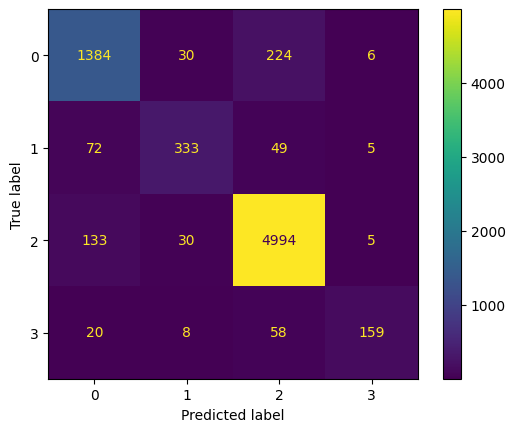

In [341]:
## creating confusion matrix:
from sklearn.metrics import ConfusionMatrixDisplay
cm=confusion_matrix(y_label, knn_pred)
cm_display = ConfusionMatrixDisplay(cm).plot()

D:\env\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


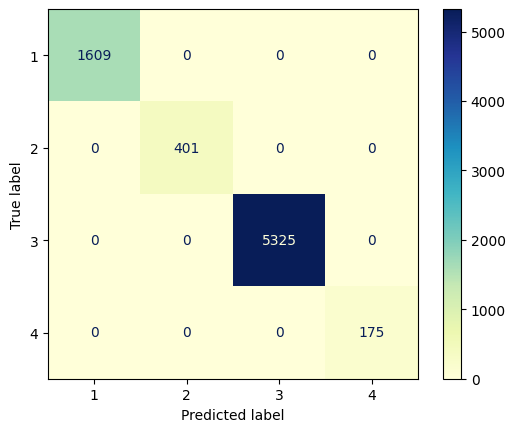

In [340]:
## detail report:
class_ml2=ml2(fixed_data)
x_train=class_ml2.train_test_split()[0]
x_test=class_ml2.train_test_split()[1]
y_train=class_ml2.train_test_split()[2]
y_test=class_ml2.train_test_split()[3]

bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(),n_estimators=10,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)
plot_confusion_matrix(bag_clf_neigh ,x_test, pd.DataFrame(knn_pred),cmap='YlGnBu');



In [342]:
kn_pred_label_list=[]
for i in prediction:
    kn_pred_label_list.append(labels[i])
    
#print(kn_pred_label_list)

In [344]:
## how correct our prediction are:


pred_df1 = pd.DataFrame({
                        "y_true":y_label,
                        "y_pred":knn_pred,
                        "true_predicted_label":true_label_list,
                        "predicted_label":kn_pred_label_list
                         })
                        
# 3. Is the prediction correct?
pred_df1["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df1[:]

,y_true,y_pred,true_predicted_label,predicted_label,pred_correct
439711,1,1,Sitting on bed,Sitting on bed,True
475939,1,1,Sitting on bed,Sitting on bed,True
565638,3,3,Lying on bed,Lying on bed,True
479415,1,1,Sitting on bed,Sitting on bed,True
373023,1,1,Sitting on bed,Sitting on bed,True
...,...,...,...,...,...
566496,3,3,Lying on bed,Lying on bed,True
522353,3,3,Lying on bed,Lying on bed,True
664531,3,3,Lying on bed,Lying on bed,True
5097,1,1,Sitting on bed,Sitting on bed,True


In [254]:
## let's try some experiments with parameters:
bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(weights='distance'),n_estimators=10,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(weights='distance'),
                  random_state=21)

In [255]:
bag_clf_neigh.score(x_test,y_test)

0.9211717709720373

##### Note: While changing  the weights ="distance" achive 0.7% higher accuracy.

In [269]:
## let's try some experiments with parameters: p=1 manhatan_distance
bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(weights='distance',p=1),n_estimators=10,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)
print(bag_clf_neigh.score(x_test,y_test))
preds_knn=bag_clf_neigh.predict(x_test)

0.952063914780293


In [270]:
preds_knn

array([1, 1, 3, ..., 3, 1, 3], dtype=int64)

#### Note: While changing  the weights ="distance" achive ~=3% higher accuracy.

In [346]:
## let's try some experiments with parameters:how far we can go:
bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(weights='distance',p=1),n_estimators=50,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)
bag_clf_neigh.score(x_test,y_test)

0.9539280958721704

1. 'brute’ will use a brute-force search.

2. ‘auto’ will attempt to decide the most appropriate algorithm based on the values passed to fit method.

In [347]:
## let's try some experiments with parameters:how far we can go:
bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(weights='distance',p=1,algorithm='brute'),n_estimators=50,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)
bag_clf_neigh.score(x_test,y_test)

0.9539280958721704

###### Note : use Auto

D:\env\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


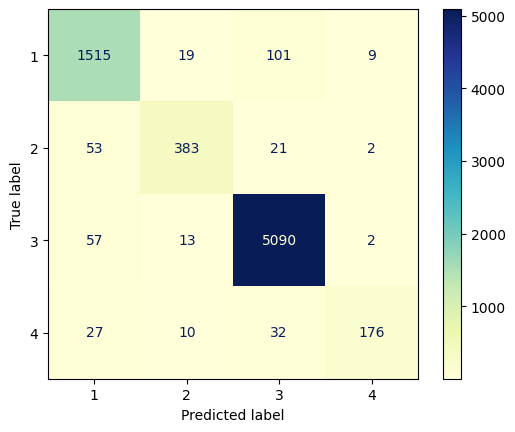

In [348]:
#new confusion matrix for bag_clf_neigh:

bag_clf_neigh=BaggingClassifier(KNeighborsClassifier(weights='distance',p=1),n_estimators=50,random_state=21,verbose=0)
bag_clf_neigh.fit(x_train,y_train)
plot_confusion_matrix(bag_clf_neigh ,x_test, pd.DataFrame(y_test),cmap='YlGnBu');


##### previous accuracy 92.4% confusion matrix:

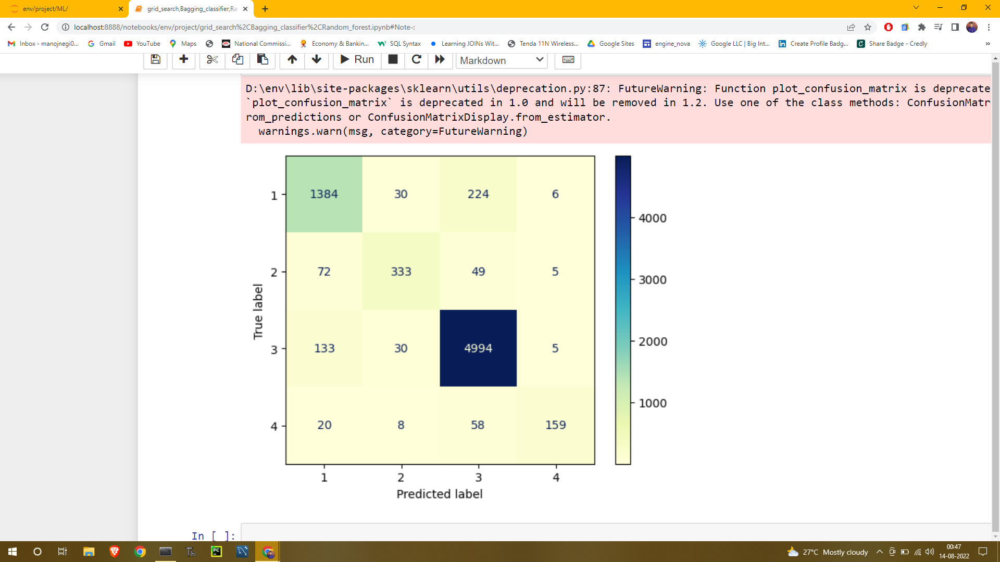

In [349]:
import sklearn
from sklearn.datasets import make_classification
report=sklearn.metrics.classification_report(y_test, pd.DataFrame(preds_knn))
print(report)

              precision    recall  f1-score   support

           1       0.92      0.91      0.92      1644
           2       0.90      0.84      0.86       459
           3       0.97      0.99      0.98      5162
           4       0.93      0.72      0.81       245

    accuracy                           0.95      7510
   macro avg       0.93      0.86      0.89      7510
weighted avg       0.95      0.95      0.95      7510



### Note: 
> result improved class 1 predited 1515 element correct which was previously 1384. similar happen with other classes.
> number of wrong prediction decreases as the truth is class 2 model predicted 1 which was previously 72 times decreased to  53

accuracy achevied approximately 99 % with baggingclassifier(DecisionTreeClassifer).
accuracy 95.3% baggingclassifier(knn) achevied we can test the model with real world data let's see the results.